# Lap time distributions (2015-2020)

Plotting the lap time distributions for the last seasons in F1. 

In [24]:
# import libraries

import numpy as np
import pandas as pd
from psycopg2 import connect, extensions, sql
from IPython.display import clear_output
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from datetime import datetime, time, date
from collections import defaultdict

# load login info for postgres 

with open("postgres_login_info.txt") as f: 
    login_info = f.read()
mpl.rcParams['figure.max_open_warning'] = 50

In [25]:
# Define a function to run a query

def query(text):
    """Run a query on the Formula_1_statistics database using the text input
    Parameters
    ---------
    text: SQL code to run
    
    Returns
    ---------
    df: DataFrame containing the result of the submitted query
    
    """
    with connect(login_info) as conn, conn.cursor() as cur:  
        autocommit = extensions.ISOLATION_LEVEL_AUTOCOMMIT
        conn.set_isolation_level(autocommit)
        
        query = sql.SQL(text)
        cur.execute(query)
        return pd.DataFrame(cur.fetchall(), columns = [desc[0] for desc in cur.description])

In [26]:
# define dictionaries for team colors and abbreviations

colors = defaultdict(lambda: '#FFFFFF', {
                     'Mercedes'      : '#00D2BE', 
                     'Ferrari'       : '#C00000', 
                     'Red Bull'      : '#0600EF', 
                     'Renault'       : '#FFF500', 
                     'Haas F1 Team'  : '#787878', 
                     'Racing Point'  : '#F596C8', 
                     'Force India'   : '#F596C8', 
                     'AlphaTauri'    : '#C8C8C8',
                     'Toro Rosso'    : '#469BFF',
                     'McLaren'       : '#FF8700', 
                     'Alfa Romeo'    : '#960000',
                     'Sauber'        : '#960000',
                     'Williams'      : '#0082FA', 
                     'Lotus F1'      : '#FFB800',
                     'Manor Marussia': '#6E0000'
                    })
team_abbrev = defaultdict(lambda: 'NA', {
                     'Mercedes'      : 'Merc', 
                     'Ferrari'       : 'Fer', 
                     'Red Bull'      : 'RB', 
                     'Renault'       : 'Ren', 
                     'Haas F1 Team'  : 'Has', 
                     'Racing Point'  : 'RP', 
                     'Force India'   : 'FI', 
                     'AlphaTauri'    : 'AT', 
                     'Toro Rosso'    : 'TR', 
                     'McLaren'       : 'McL', 
                     'Alfa Romeo'    : 'AR', 
                     'Sauber'        : 'Sau', 
                     'Williams'      : 'Wil',
                     'Lotus F1'      : 'Lot', 
                     'Manor Marussia': 'MM'
                    })

In [27]:
# return the lap times for 1 driver over 1 race, filtering out pit stops and safety car periods, which are defined as a lap
# time above a certain percentage of the fastest lap of the race (20% by default). This allows drivers to still be 
# peanilized for various spins and shunts

def get_lap_distribution(firstname=None, lastname=None, driverref=None, race_name=None, year=None, cutoff=1.2): 
    """Run a query to find the lap times for a driver over the course of 1 race"""
    
    text = f"""
    -- construct gp info
    WITH gps AS (SELECT EXTRACT(MINUTES FROM lap_times.time)*60 +
                            EXTRACT(SECONDS FROM lap_times.time) AS lap_time, 
                        lap_times.lap, 
                        lap_times.position, 
                        lap_times.driverid, 
                        lap_times.raceid,
                        EXTRACT(YEAR FROM races.date) AS year
                 FROM lap_times 
                 JOIN races ON lap_times.raceid = races.raceid 
                 JOIN circuits ON races.circuitid = circuits.circuitid
                 WHERE ((races.name iLike '%{race_name}%') AND year = {year})
                 ), 
                 
    -- construct pit info
    pits AS (SELECT pit_stops.driverid, 
                    pit_stops.raceid, 
                    pit_stops.stop, 
                    pit_stops.lap AS pit_lap, 
                    pit_stops.time, 
                    pit_stops.duration
             FROM pit_stops
             JOIN races ON pit_stops.raceid = races.raceid
             JOIN drivers ON pit_stops.driverid = drivers.driverid
             WHERE(
                  (races.name iLike '%{race_name}%') 
                   AND year = {year}
                   AND ((drivers.forename iLike '%{firstname}%'
                       AND drivers.surname iLike '%{lastname}%') 
                        OR drivers.driverref iLike '%{driverref}%')
              )
    ),
    
    
    -- find the fastest lap to filter safety car laps
    fastest_lap AS (SELECT MIN(gps.lap_time) AS time FROM gps) 
        
    -- put it all together
    SELECT gps.lap,
           gps.year, 
           gps.lap_time,
           gps.position,
           drivers.code,
           races.name,
           -- whether or not the driver retired
           CASE WHEN ((SELECT MAX(gps.lap)
                       FROM gps
                       JOIN races ON races.raceid = gps.raceid
                       JOIN drivers ON drivers.driverid = gps.driverid
                       WHERE races.year = {year} AND 
                       races.name iLike '%{race_name}%' AND 
                       (
                           (drivers.forename iLike '%{firstname}%' 
                            AND drivers.surname iLike '%{lastname}%')
                            OR drivers.driverref iLike '%{driverref}%'
                        ))
                      >=( SELECT MAX(gps.lap)
                    FROM gps
                    JOIN races ON races.raceid = gps.raceid
                    WHERE races.year = {year} AND races.name iLike '%{race_name}%') -2
                    )
                THEN FALSE
                ELSE TRUE
                END
            AS retired
           
    FROM drivers 
    JOIN gps ON drivers.driverid = gps.driverid
    JOIN races ON gps.raceid = races.raceid
    WHERE(
        ((drivers.forename iLike '%{firstname}%' 
        AND drivers.surname iLike '%{lastname}%')
        OR drivers.driverref iLike '%{driverref}%')
        AND gps.lap NOT IN (SELECT pits.pit_lap FROM pits)
        AND gps.lap_time < {cutoff} * (SELECT fastest_lap.time FROM fastest_lap))
        
    ORDER BY gps.lap

    """
    
    df = query(text)
    
    return df

In [28]:
# get the lap time distribution for every driver over a race

def get_race_distribution(race_name, year, cutoff=1.2):
    """Query a dataframe to get the lap times of every driver on the grid over the course of a race"""
    
    drivers_text = f"""

    SELECT drivers.forename AS firstname,
           drivers.surname AS lastname,
           drivers.code, 
           drivers.driverid, 
           drivers.driverref,
           results.positionorder,
           races.name AS race_name, 
           constructors.name AS team
    FROM drivers
    JOIN results ON results.driverid = drivers.driverid
    JOIN races ON races.raceid = results.raceid
    JOIN constructors ON constructors.constructorid = results.constructorid
    WHERE races.year = {year} AND races.name iLike '%{race_name}%'
    """
    
    drivers_df =  query(drivers_text);
    frames = [get_lap_distribution(driverref=ref, race_name=race_name, year=year, cutoff=cutoff) 
              for ref in drivers_df['driverref']];
    lap_time_results = pd.concat(frames).sort_values(by="lap_time")
    lap_time_results['team'] = [drivers_df[drivers_df['code'] == i]['team'].values[0] for i in lap_time_results['code']]
    
    return lap_time_results.sort_values(by="position")

In [29]:
# get the finishing order

def get_finishing_order(race_name, year):
    results_text = f"""
    SELECT results.positionorder, 
           drivers.code
    FROM results
    JOIN races ON races.raceid = results.raceid
    JOIN drivers ON drivers.driverid = results.driverid
    WHERE races.year = {year} AND races.name iLike '%{race_name}%' 
    
    ORDER BY results.positionorder
    """
    results_df = query(results_text); 
    return results_df

In [30]:
# Make a plot of all the lap distributions for a race

def plot_race_distribution(race_name, year, outliers=False, whis=1.5, cutoff=1.2, colors=colors): 
    """Plot the distribution of lap times over the course of a race"""
    df = get_race_distribution(race_name=race_name, year=year, cutoff=cutoff);
    fastest_lap = df['lap_time'].min()
    slowest_lap = df['lap_time'].max()
    
    finishing_order = get_finishing_order(race_name=race_name, year=year)['code'].to_numpy()
    
    sns.set_style("ticks")
    
    %config InlineBackend.figure_format = 'svg'

    fig, ax = plt.subplots(figsize=[12, 4])
    sns.boxplot(ax=ax,
                data=df[df['retired']==False],
                y="lap_time", 
                x="code", 
                hue="team", 
                palette=colors, 
                showfliers=outliers,
                whis=1.5,
                dodge=False, 
                order=finishing_order
                );
    ax.legend(bbox_to_anchor=(1,1),
              loc='upper left',
              ncol=1,  
              fontsize=12)

    ax.set_xlabel("driver", fontsize=12)
    ax.set_ylabel("lap time (seconds)", fontsize=12),
    ax.set_ylim([(fastest_lap-0.5), fastest_lap*(cutoff)+2])
    ax.tick_params(labelsize=10)
    
    ax.set_title(f"Lap time distribution for the {year} {df['name'].values[0]}\n", fontsize=15)
    return ax, df

In [31]:
# plot all the races in a season

def plot_all_races(year, cutoff=1.2, outliers=True):
    text = f"""
    SELECT name
    FROM races
    WHERE year = {year}
    ORDER BY round
    """

    df = query(text)
    for race in df['name']: 
        try: 
            plot_race_distribution(race, year, cutoff=cutoff, outliers=outliers)
        except Exception as e: 
            print(f"no data for {race}")
            print(str(e))

no data for Bahrain Grand Prix
No objects to concatenate
no data for Sakhir Grand Prix
No objects to concatenate
no data for Abu Dhabi Grand Prix
No objects to concatenate


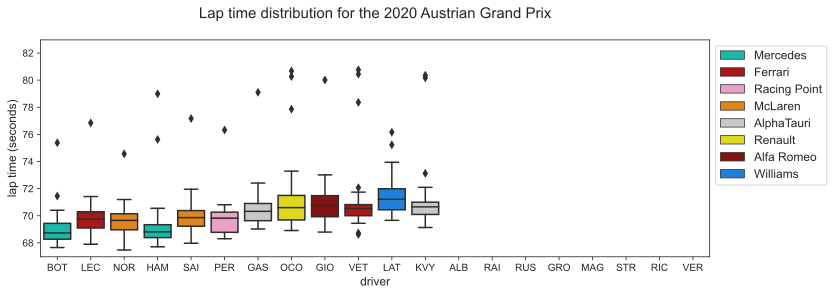

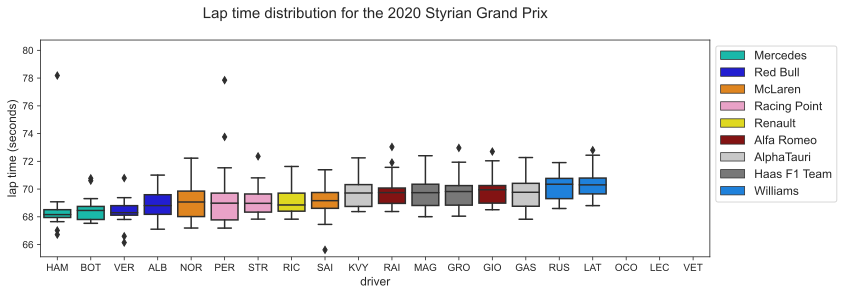

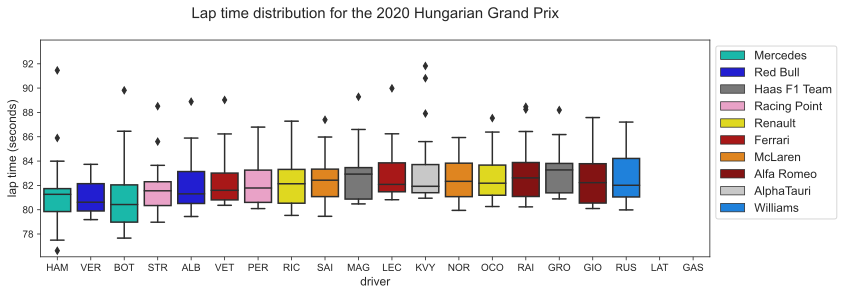

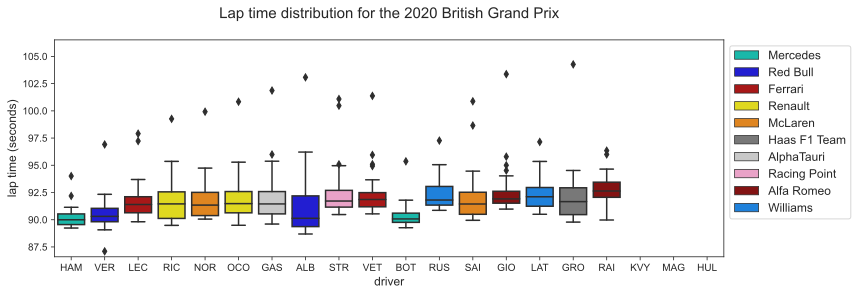

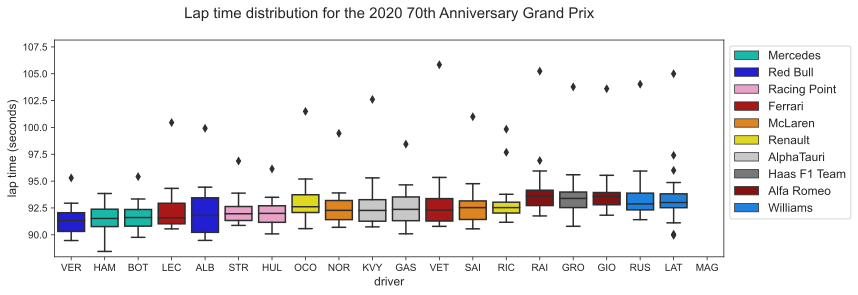

...

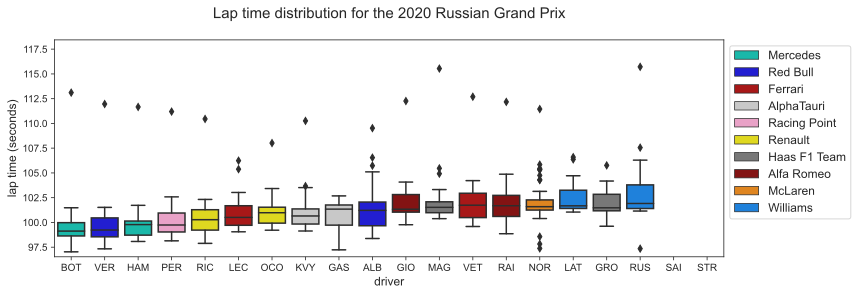

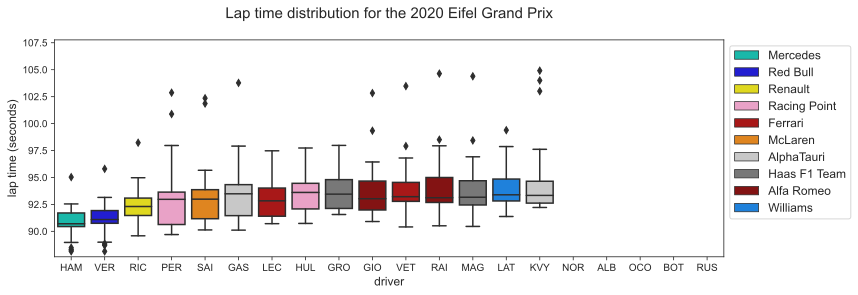

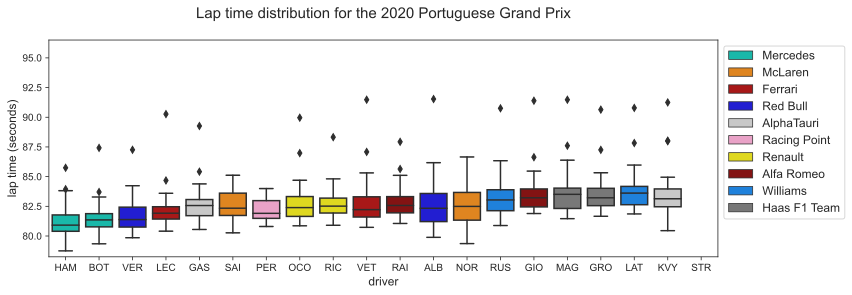

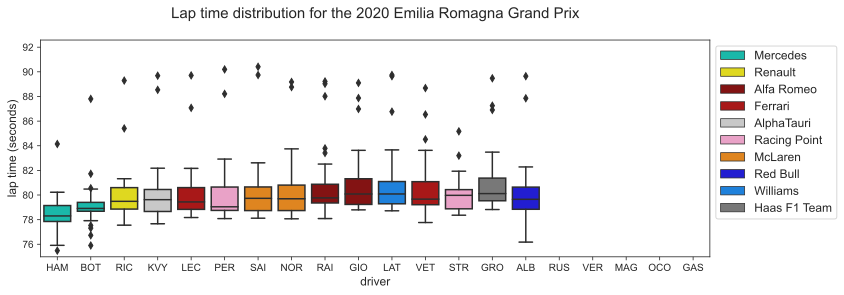

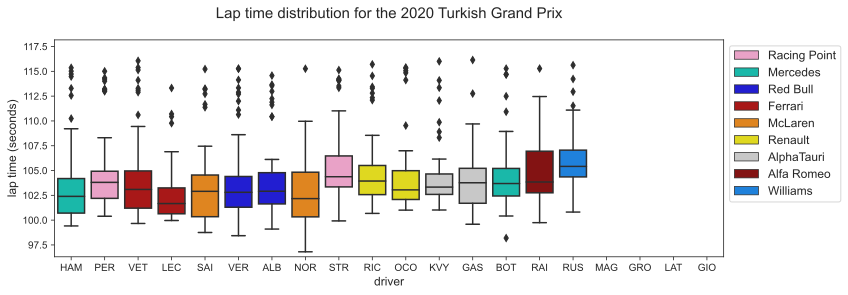

In [32]:
plot_all_races(2020, cutoff=1.2, outliers=True)

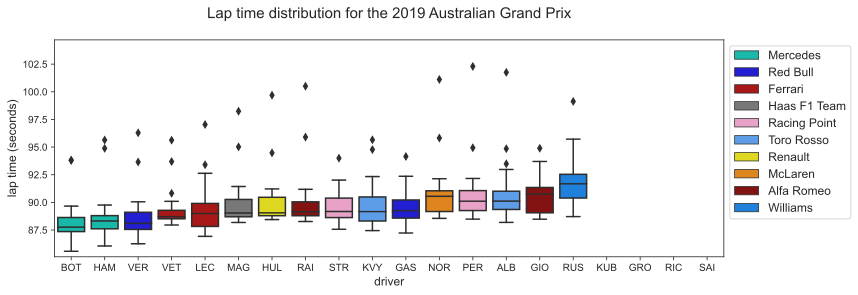

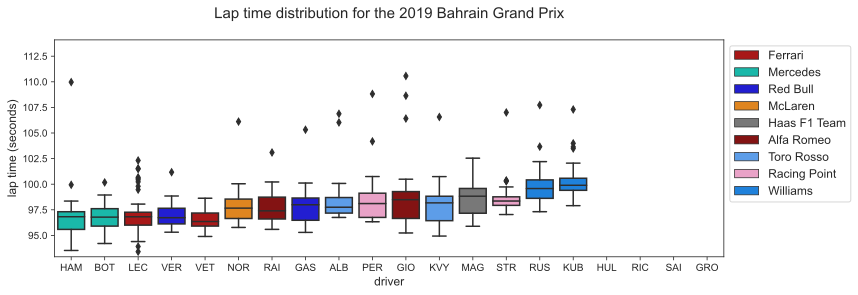

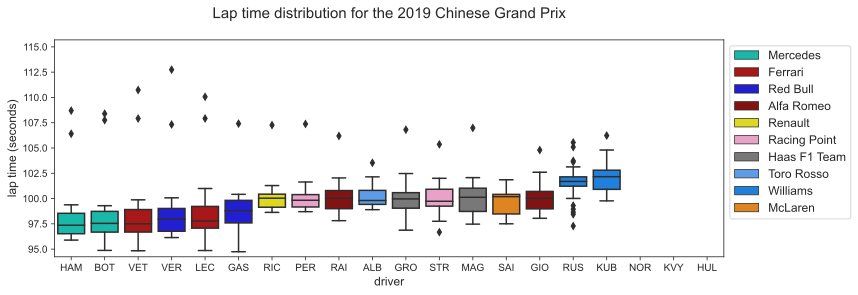

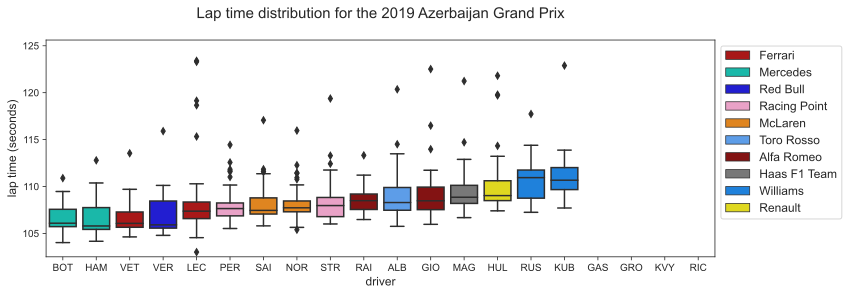

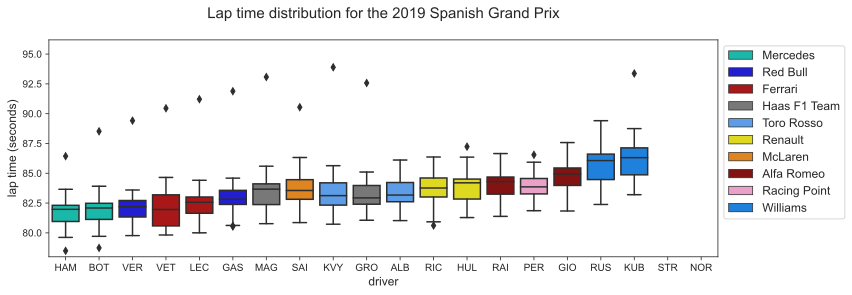

...

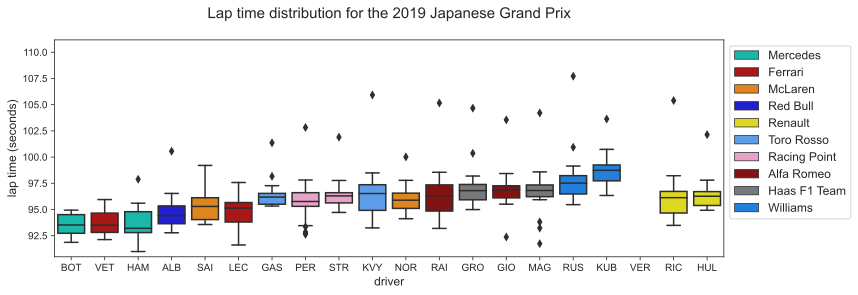

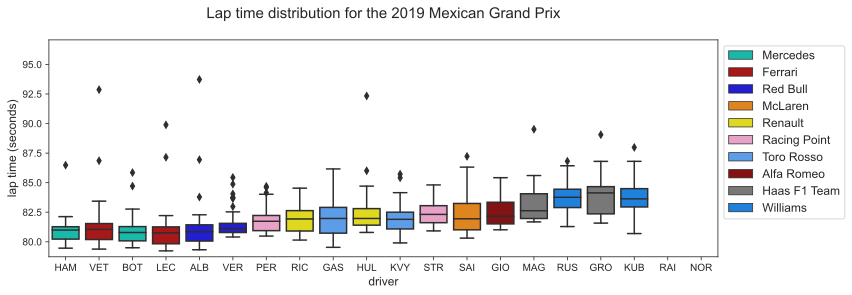

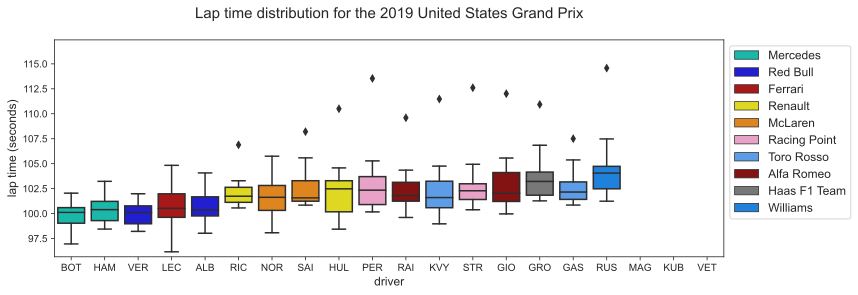

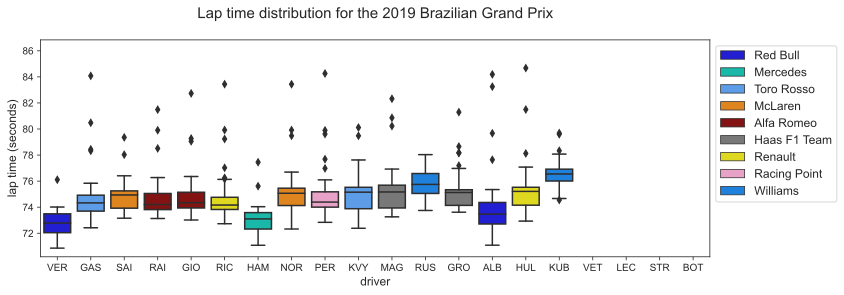

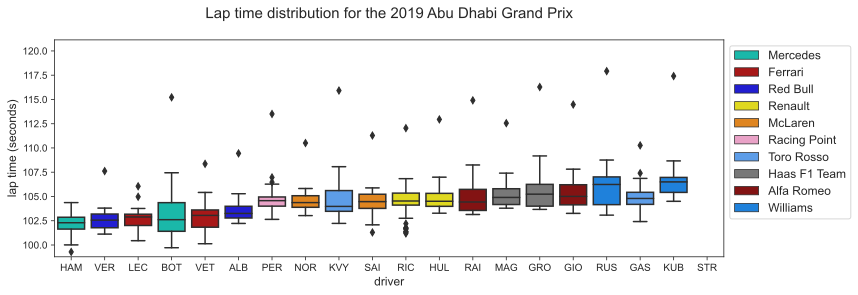

In [33]:
plot_all_races(2019, cutoff=1.2, outliers=True)

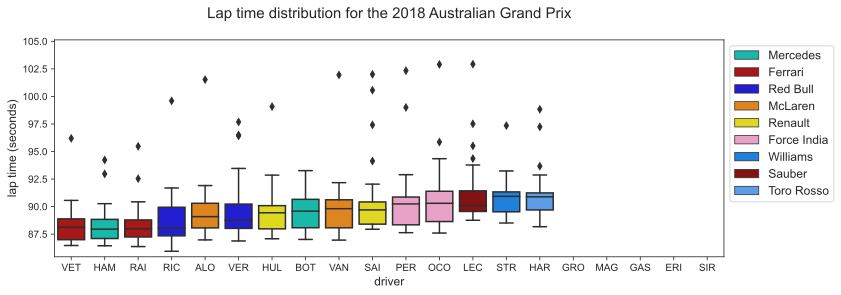

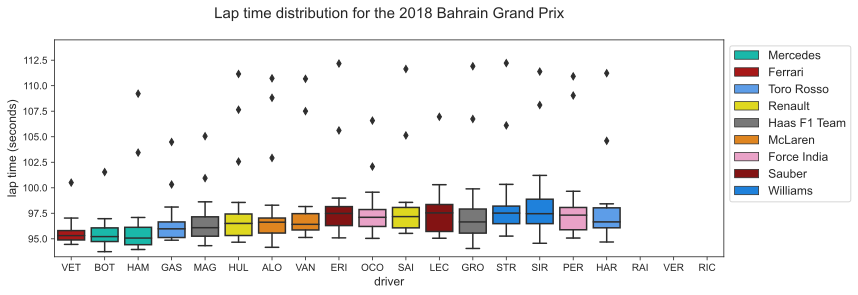

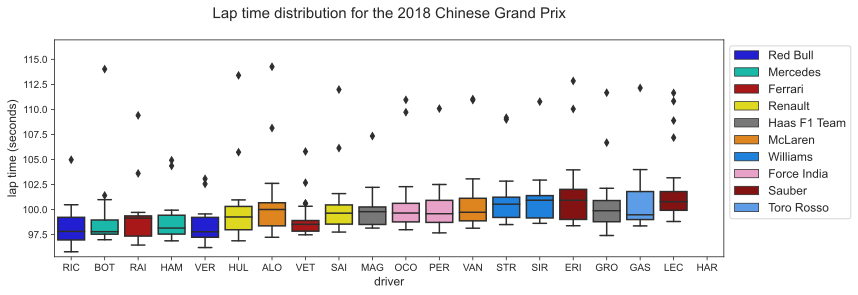

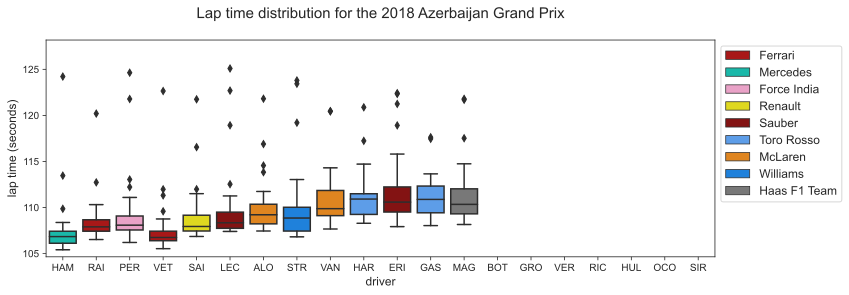

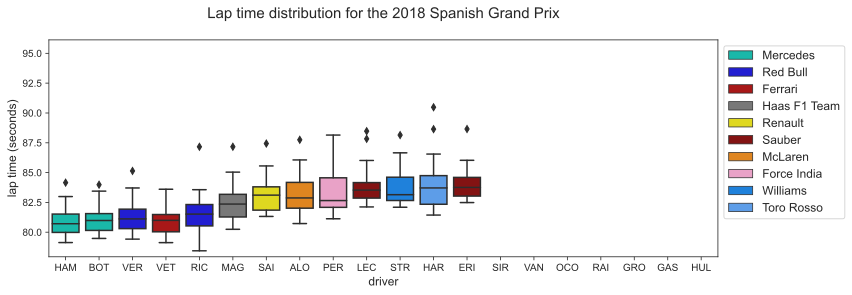

...

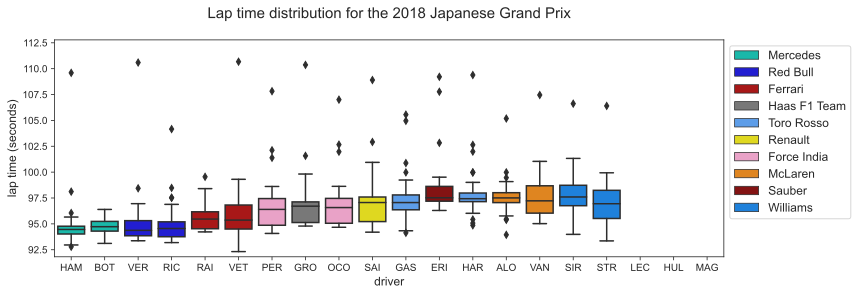

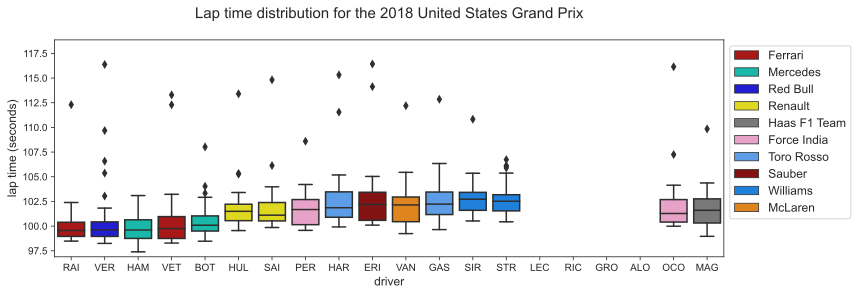

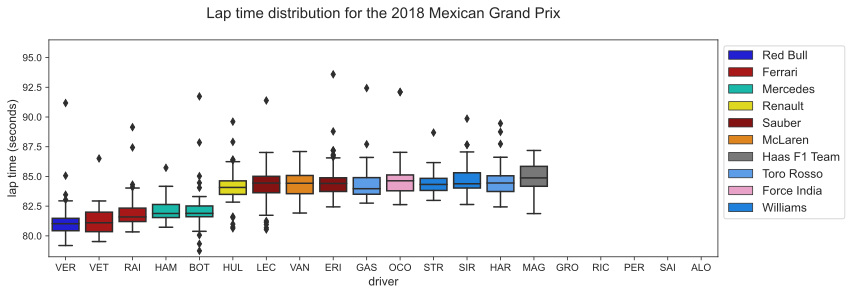

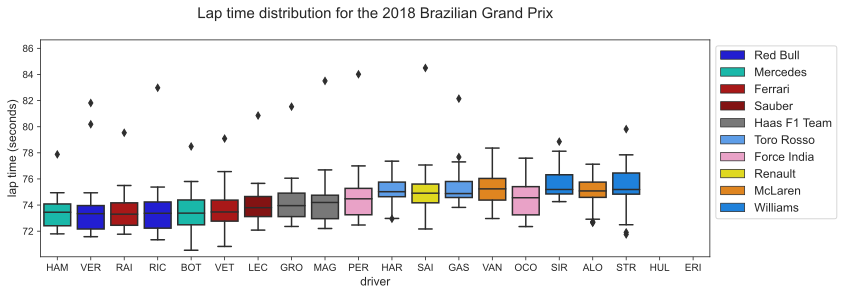

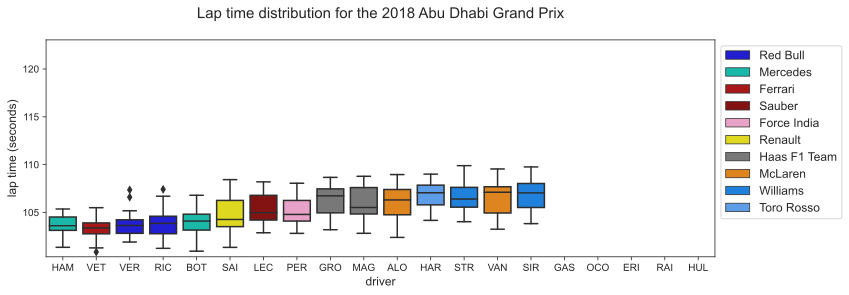

In [34]:
plot_all_races(2018, cutoff=1.2, outliers=True)

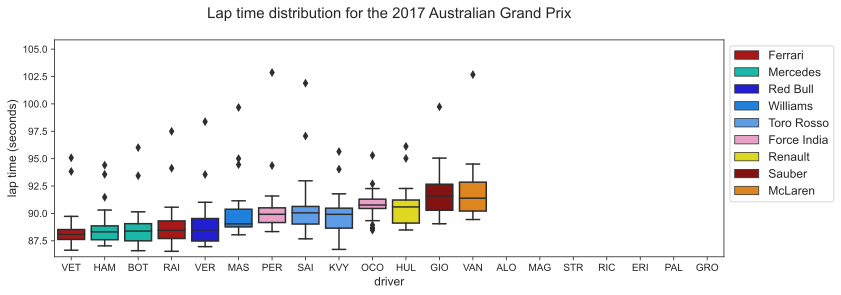

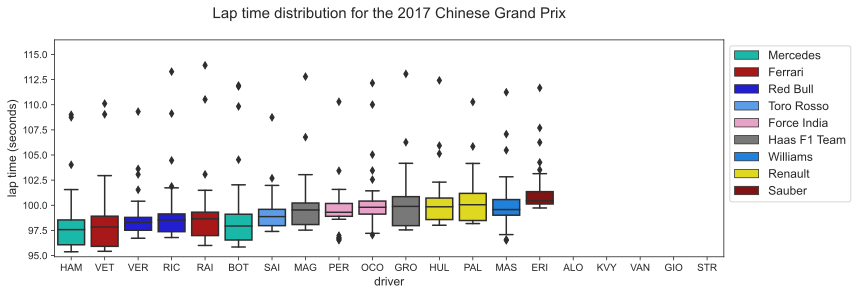

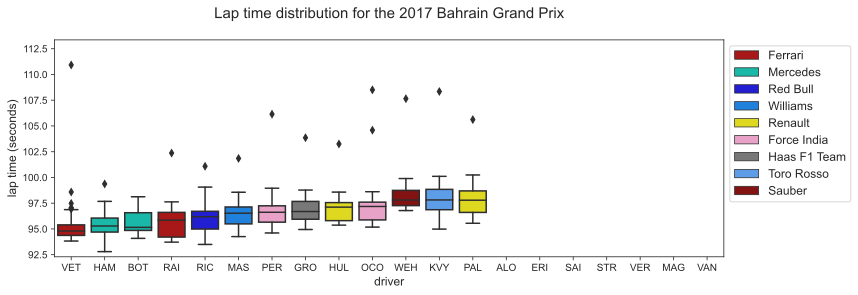

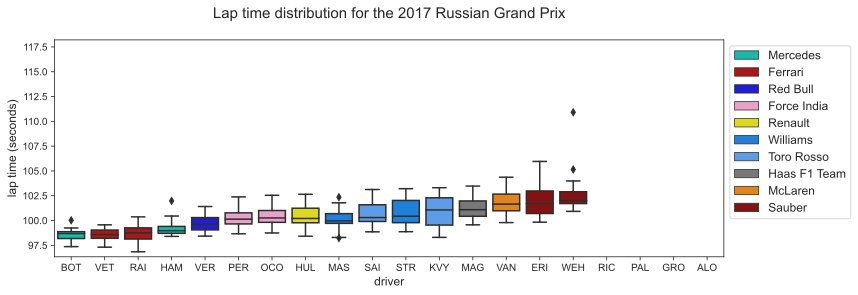

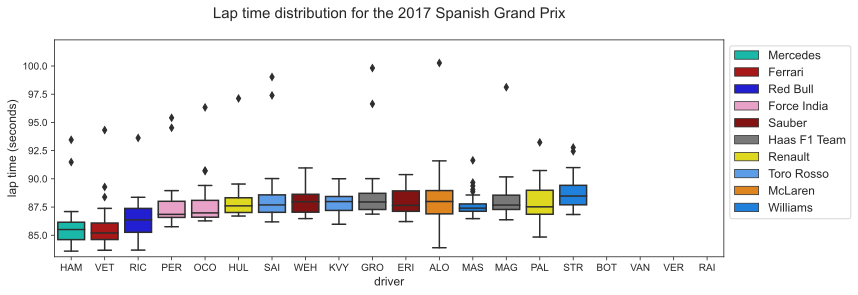

...

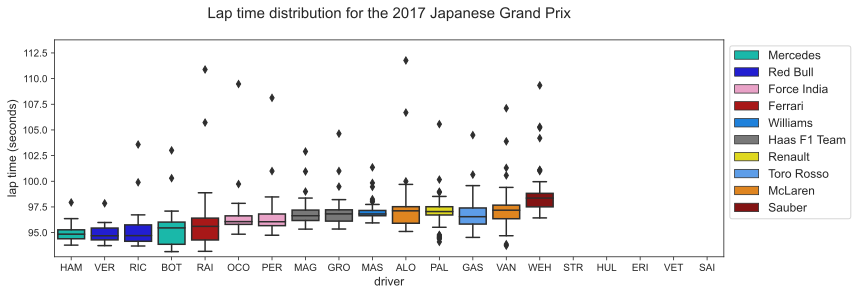

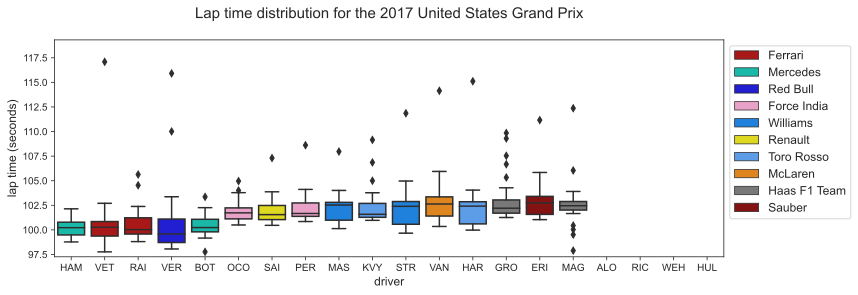

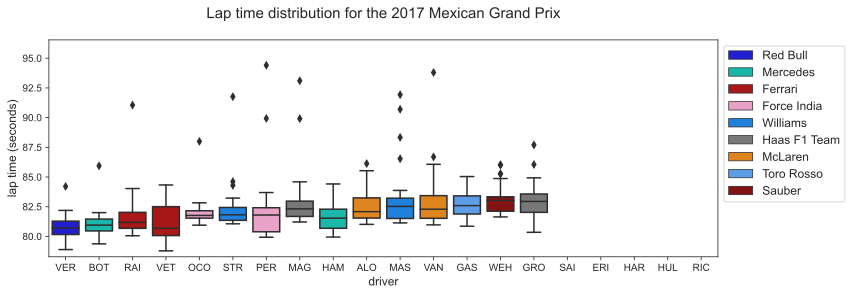

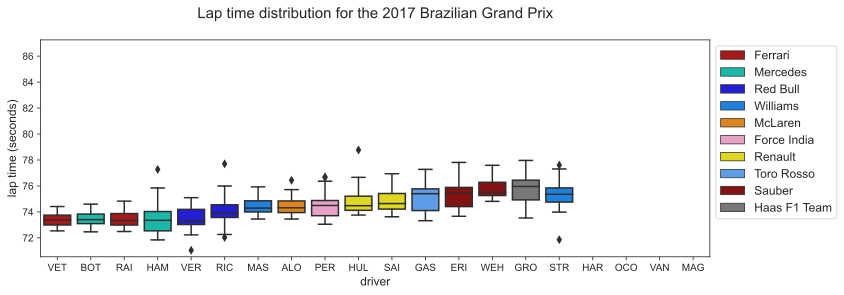

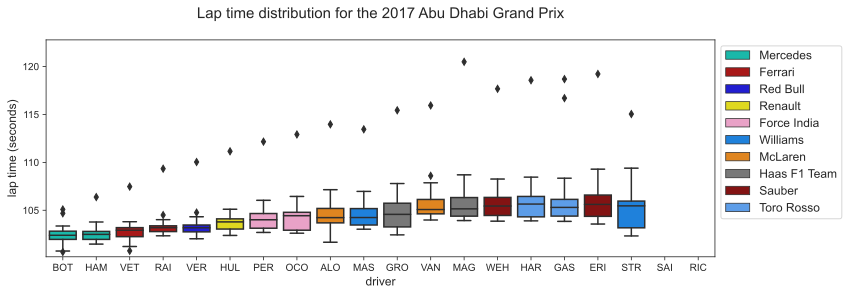

In [35]:
plot_all_races(2017, cutoff=1.2, outliers=True)

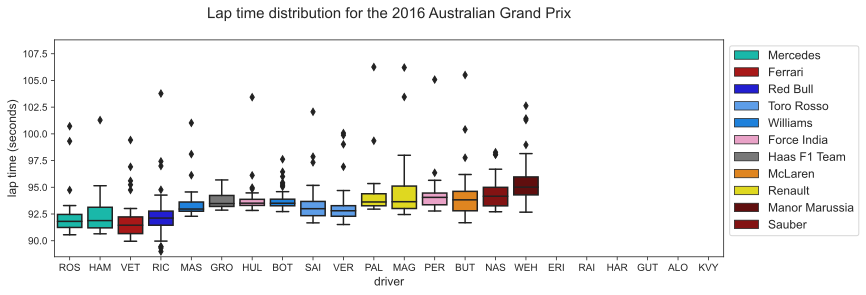

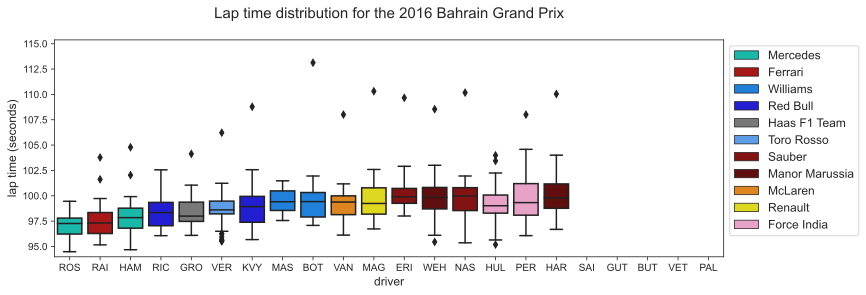

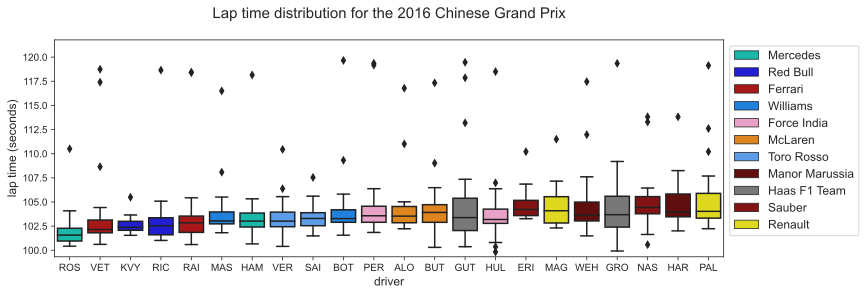

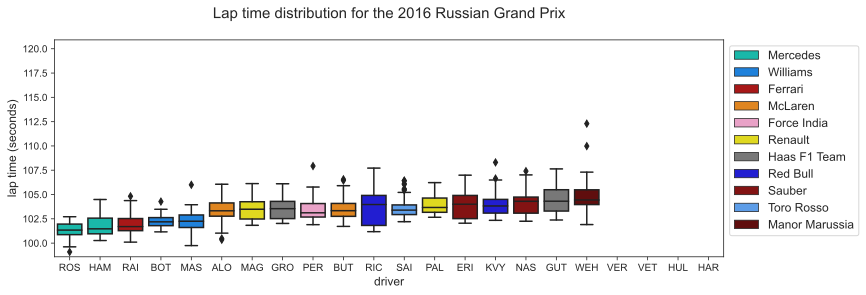

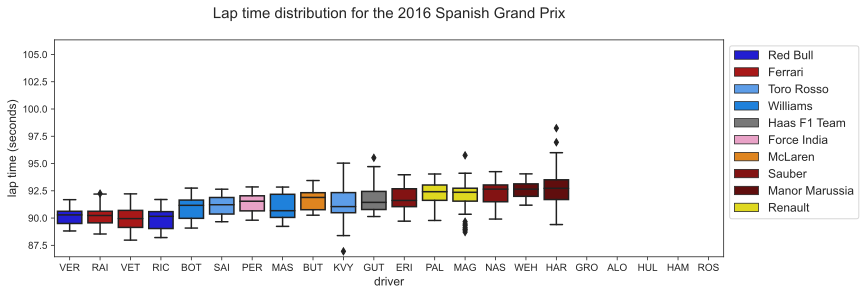

...

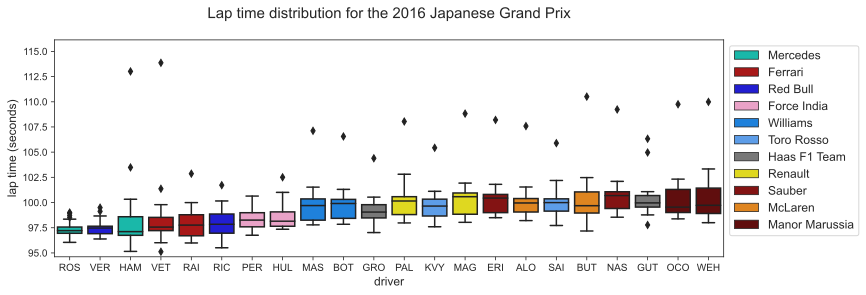

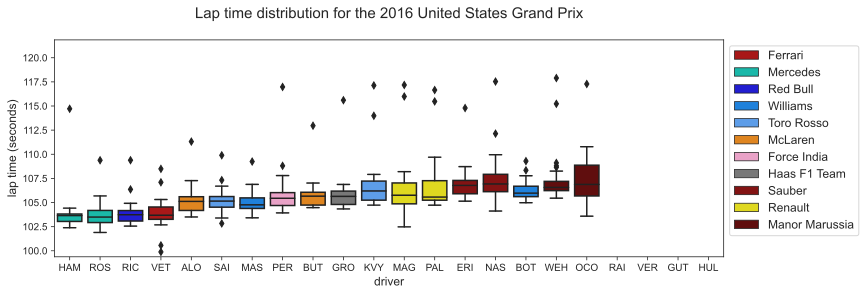

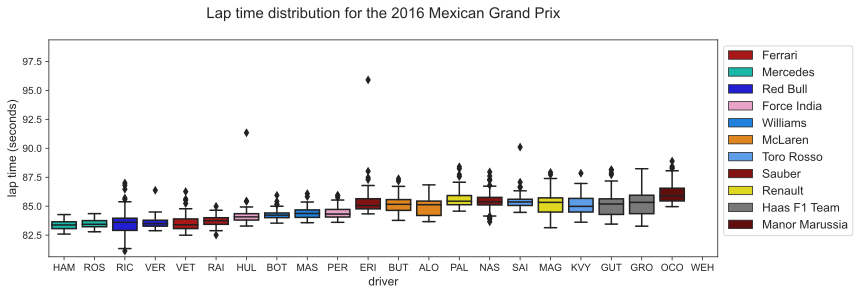

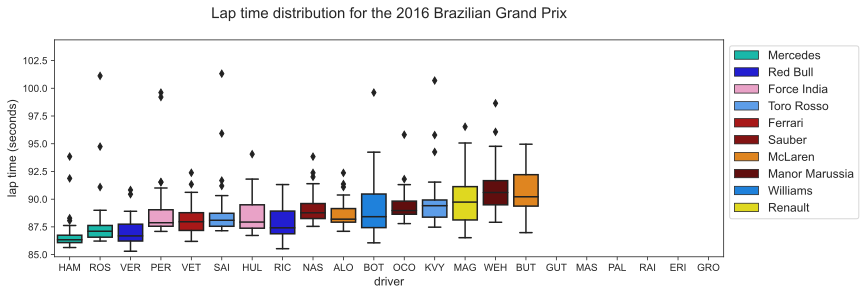

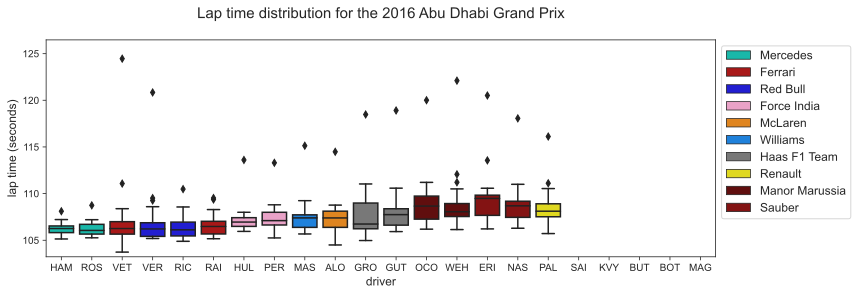

In [36]:
plot_all_races(2016, cutoff=1.2, outliers=True)

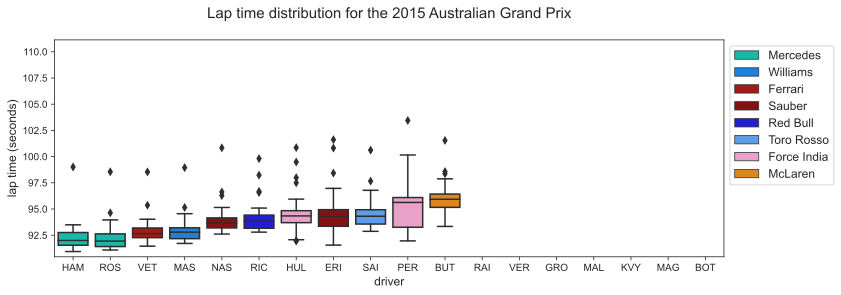

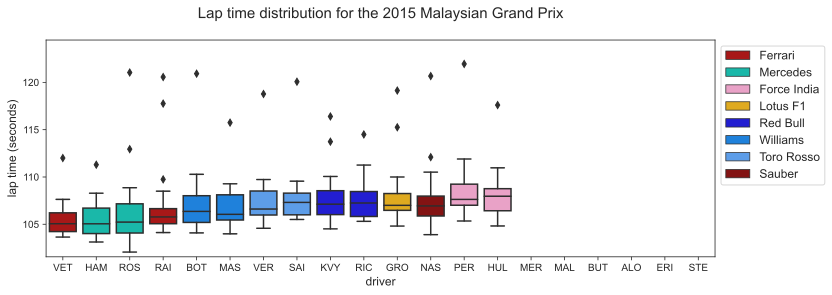

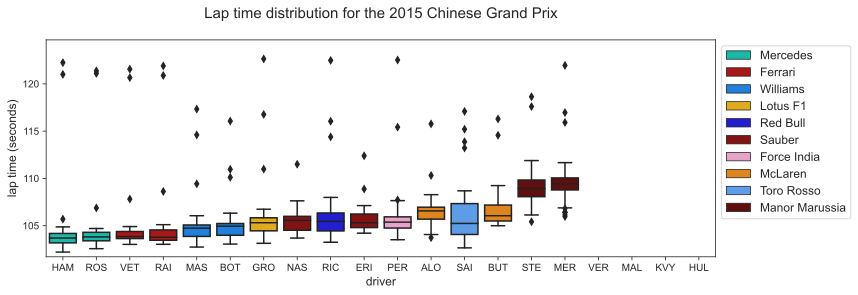

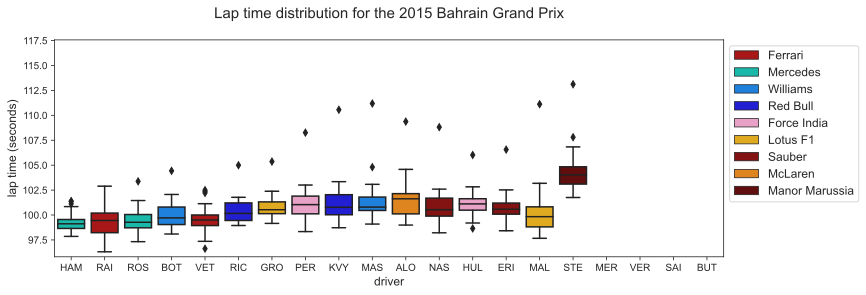

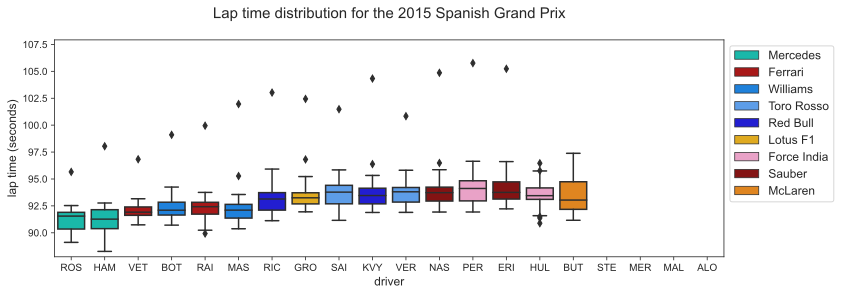

...

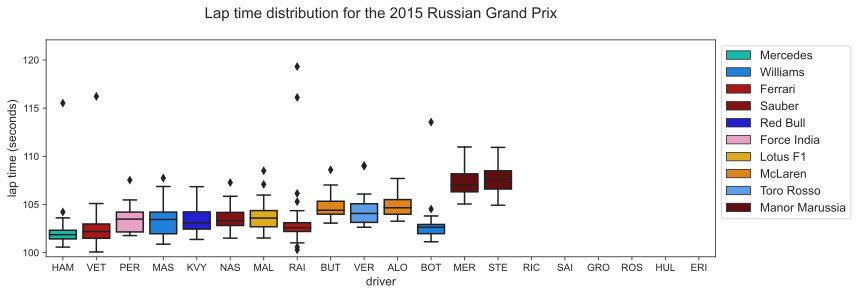

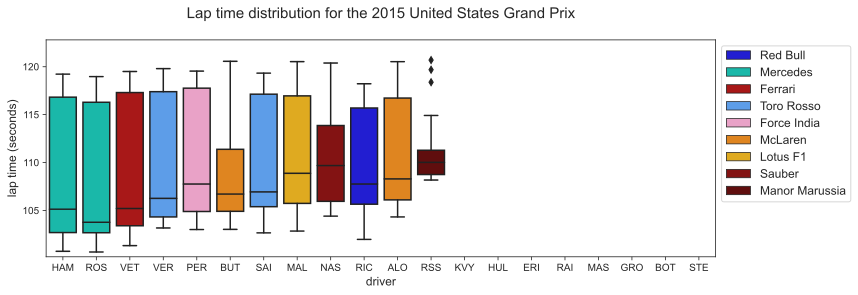

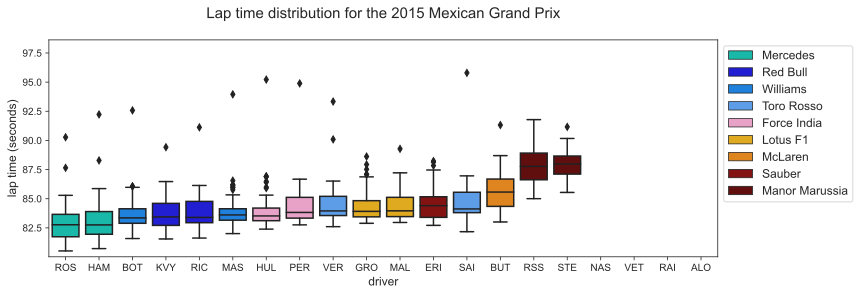

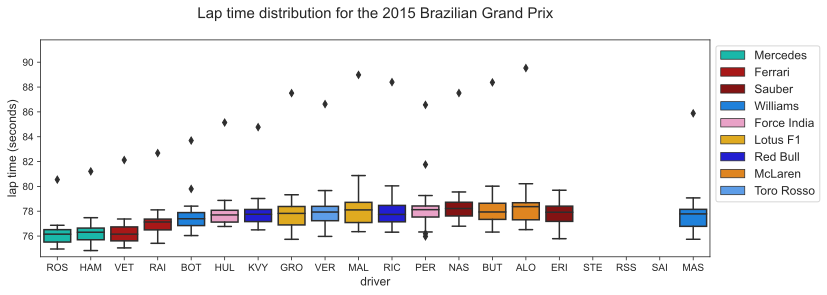

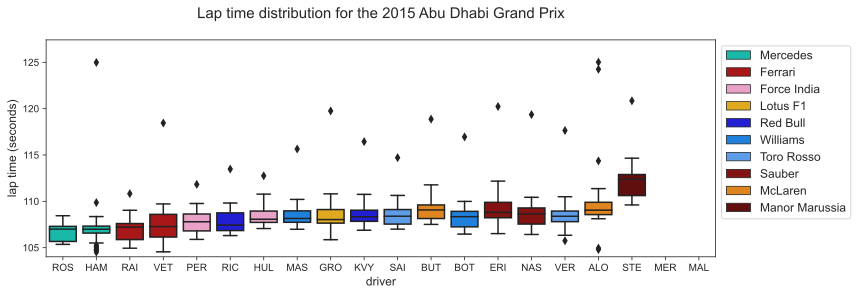

In [37]:
plot_all_races(2015, cutoff=1.2, outliers=True)